# World Data League 2022

## 🎯 Challenge
**Optimization of public transport routes during
road interruptions** by Cascais Municipality


## Team: DataBased
## 👥 Authors
* André Luís
* Rui Monteiro
* José Diogo Castro

## 💻 Development
<!-- <details>
<summary><b>Instructions Here</b></summary>

Start coding here! 🐱‍🏍

Create the necessary subsections (e.g. EDA, different experiments, etc..) and markdown cells to include descriptions of your work where you see fit. Comment your code. 

All new subsections must start with three hash characters.

Pro-tip 1: Don't forget to make the jury's life easier. Remove any unnecessary prints before submitting the work. Hide any long output cells (from training a model for example). For each subsection, have a quick introduction (justifying what you are about to do) and conclusion (results you got from what you did). 

Pro-tip 2: Have many similiar graphs which all tell the same story? Add them to the appendix and show only a couple of examples, with the mention that all the others are in the appendix.

</details> -->

### 1. Context

**Cascais** is a town and municipality in the Lisbon District of Portugal with 214 158 inhabitants in an area of 97 km2. It has 4 parishes: *Alcabideche, Carcavelos e Parede, Cascais e Estoril* and *São Domingos de Rana*. The municipality intends to increase its pioneering spirit in structuring smart and resilient cities, in order to bring the future of local cities into the present.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/8c/Cascais_freguesias_2013.svg/800px-Cascais_freguesias_2013.svg.png" alt="Municipalities" width="650"/>

In Cascais, similarly to many cities, road work happens all the time. Road interventions are a nuance for public transportation, but they are necessary and may cause traffic cuts or drifts, which is an inconvenience to the residents and to the city's entire mobility system. These can lead to situations of distrust in the reliability of the public transport network.

<img src="https://static.globalnoticias.pt/dn/image.jpg?brand=DN&type=generate&guid=83ba13ac-233c-433b-a21d-80f124838b03&w=800&h=450&t=20220224082847" alt="Bus Cascais" width="550"/>

This municipality wants to discover intervention trends on public roads that indicate locations more prone to these interventions, which may require differentiated communication strategies targeted at local users. The goal of the project is to model, from the point of view of trends, which routes of the transport road network suffer the most cuts/disturbance due to interventions on public roads. We should try to evaluate the effort needed to adapt the services to match the network's needs in the presence of disruptions due to physical obstacles preventing circulation along usual routes. Additionally, we should try to evaluate and quantify levels of the perception of "inconvenience" by network users caused by different disruptions.

The goal of this project is associated with United Nation’s **Sustainable Development Goal 11**, "Sustainable Cities and Communities", more specifically with its target 11.2: **"provide access to safe, affordable, accessible and sustainable transport systems for all"** [1].

<img src="https://ec.europa.eu/eurostat/documents/276524/8267079/E_INVERTED+SDG+goals_icons-individual-RGB-11.png/aa706ac3-a6eb-46ac-83e0-a982ac4e36bf?t=1506689568969" alt="SDG 11" width="200"/>

### 2. Data Sources

- Public Transport Network ([link](https://dadosabertos.cascais.pt/dataset/gtfs-mobicascais));
- Bus Routes ([link](https://dadosabertos.cascais.pt/dataset/carreira-de-autocarro));
- Road Network ([link](https://dadosabertos.cascais.pt/dataset/eixo-de-via));
- Interventions in public roads ([link](https://dadosabertos.cascais.pt/dataset/obras-de-intervencao-na-via-publica)).

### 3. Introduction

With the prediction that two-thirds of the world's population will live in an urban center by 2050, cities are looking for new sustainable growth models.

Data from the United States of America shows that in 2019 alone, Americans took 9.9 billion trips on public transportation [2]. Research also showed that public transportation provides economic opportunities, is safer to travel than cars, saves money, reduces gasoline consumption and reduces carbon footprint.

Facts like these highlight the importance of Sustainable Development Goal 11. Having a good public transport network is essential for a sustainable city.

#### 3.1) Public Transport Network in Cascais

In fact, according to Sustainable Development Goal 11, a public transport network should be "safe, affordable, accessible and sustainable":
- The one in Cascais is **safe**, because all the buses have video surveillance to assure their safety [3]. 
- It is also **affordable**, because since 2020 it is free for students, residents and people working in the municipality [4]. This is a monetary saving measure for the population that also accompanies the local strategy of promoting a lifestyle that places sustainability as a priority.
- It seems to also be **accessible**, because it spans over the majority of the municipality. The public transport network in Cascais includes 44 bus lines and is managed by the *Autoridade de Transportes do Município de Cascais*.
- Finally, it is **sustainable**, because the city council is focused on sustainability and decarbonisation. They have been investing millions of euros to minimize the network's pollution emissions [5]. To do so, they garantee the fleet of vehicles is equipped with the highest standards of energy efficiency.

Still, in this project, we want to suggest a product/application that makes use of Data Science techniques to improve the efficiency of the network in Cascais. Thus, we want to make sure public transports are **as accessible as possible** to the users, even when some roads are not.

#### 3.1) How to Improve Public Transport

According to dell’Olio et al. (2011) [6], the quality of service desired by public transport users focuses on **waiting time, cleanliness and comfort**. Variables such as driver kindness, bus occupancy and journey time are generally given less weight.

Thus, we can conclude waiting time is, indeed, essential for users to be satisfied with the network in Cascais.

### 4. Import and Assess Data

The first step is to import all the data needed for this project.

In [ ]:
# INSTALL REQUIRED PACKAGES
!pip install geopandas
!pip install geojson
!pip install gtfsutils
!pip install contextily
!pip install MiniSom

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shapely.geometry
from shapely.geometry import shape
import geopandas as gpd
import geojson
import requests
import json
import gtfsutils
import gtfsutils.routes
import gtfsutils.filter
import contextily as cx
from sklearn import preprocessing, cluster 
import scipy
import minisom
import matplotlib.patches as mpatches

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

import warnings
warnings.filterwarnings('ignore')

Mounted at /content/gdrive/


In [3]:
# Declare the directory path for the data files
path = '/content/gdrive/Shareddrives/WDL - DataBased/Stage 2/data/'

#### 4.1) Public Transport Network

In order to optimize the public transport routes during road interruptions, we need to have data about the current routes that are performed, combined with its calendar and stops along the way. 

To this purpose, we will use the General Transit Feed Specification (GTFS) data about the **public transport network of Cascais**, which is structured as follows:
- **agency.txt**: Provides information about the transit agency
- **calendar_dates.txt**: Specifies exceptions to the default service patterns
- **calendar.txt**: For each service, on which days it operates
- **fare_attributes.txt**: Information about the fare classes
- **feed_info.txt**: Information about the organization that publishes the dataset
- **routes.txt**: Information on specific routes
- **shapes.txt**: Paths that vehicles travel along a route
- **stop_times.txt**: Timestamped stops along the trips
- **stops.txt**: Information about the stops
- **trips.txt**: Information about the trips

In [4]:
# Read GTFS zip file
df_dict = gtfsutils.load_gtfs(path + 'cascais.zip')
df_dict.keys()

dict_keys(['agency', 'calendar', 'calendar_dates', 'fare_attributes', 'feed_info', 'routes', 'shapes', 'stops', 'stop_times', 'trips'])

By analysing each file, we can understand that: 
- There are 44 Bus Routes
- There are 1043 Bus Stops
- There are 3644 Trips
- There is only one agency performing these routes (MobiCascais)
- There are 2 possible fare prices

Besides, this data comprises the entire year of 2022, in terms of when the service will be available, as well as exceptions to the normal functioning of the service, either because the service is added or removed.

In [5]:
# Accessing data
df_dict['agency']

,agency_id,agency_name,agency_url,agency_timezone,agency_lang,agency_phone,agency_fare_url
0,mobi_cascais_bus,Cascais Próxima E.M. S.A.,http://www.mobicascais.pt/,Europe/Lisbon,pt,800203186,https://www.mobicascais.pt/


Let us analyze the top-5 **most frequent routes** in the analyzed period:

In [6]:
pd.set_option('display.max_colwidth', -1)

gdf_routes = gtfsutils.routes.load_routes_counts(df_dict)
gdf_routes.sort_values(by='counts', ascending=False)[['route_long_name', 'counts']].head()

,route_long_name,counts
29,Carcavelos Estação - Hospital de Cascais via Bicesse,208
15,S. Domingos de Rana - Campus Carcavelos,198
12,Cascais Estação - Estoril Estação via Manique,185
43,São João do Estoril Estação – CascaiShopping (Interface),172
28,Parede Terminal - Abóbada,171


In [7]:
pd.reset_option('max_colwidth')

#### 4.2) Road Network

The original data file "eixodevia.geojson" had a rogue comma, in order to fix it the following code was aplied:

```
eixodevia_json_string = requests.get(url, verify=False).text
eixodevia_json = json.loads(re.sub(',\r\n,', ',\r\n', eixodevia_json_string))
```

After this process, the variable eixodevia_json was saved in our cloud database as "eixo_via_corrected.json" so that we can later read it.

In [8]:
# Load Road Network data 
road_network = gpd.read_file(path + 'eixo_via_corrected.json')
road_network.head()

,Geometry name,Nome,Tipo,Classificação,Comprimento,Sentido,Código,Rua Id,geometry
0,Posição,Rua Lucília do Carmo (Fadista),Normal,Rua,44.81,Dois Sentidos,20000,1686247,None
1,Posição,Rua Baptista Pereira,Normal,Rua,16.33,Dois Sentidos,20002,1675638,None
2,Posição,Rua Baptista Pereira,Normal,Rua,15.54,Directo,20003,1675638,None
3,Posição,Rua Aires de Saldanha,Normal,Rua,8.411,Dois Sentidos,16904,2234168,None
4,Posição,Praceta Aires de Saldanha,Normal,Rua,38.82,Dois Sentidos,16905,2234217,None


As can be seen on the table above, 👆, the data properties from file "eixo_via_corrected.json" were all correctly loaded **except** the **geometry** column. That column should contain coordinates of the points that make part of a certain street (i.e., the street's polygon).

In [9]:
# Import "eixo_via_corrected.json" as a json file to get the geometry data and insert on the road_network
with open(path + 'eixo_via_corrected.json') as f:
    road_net_geojson = geojson.load(f)

# Convert geometry data into geojson.geometry.LineString data type
coordinates = list()

for row in road_net_geojson['features']:
    j = row['geometry']
    j['coordinates'] = j['coordinates'][0]
    geom = shape(j)
    coordinates.append(geom)

# Insert into the geometry column of the road_network DataFrame
road_network['geometry'] = coordinates

# Check final road_network DataFrame
road_network.head()

,Geometry name,Nome,Tipo,Classificação,Comprimento,Sentido,Código,Rua Id,geometry
0,Posição,Rua Lucília do Carmo (Fadista),Normal,Rua,44.81,Dois Sentidos,20000,1686247,"LINESTRING (-9.39074 38.73557, -9.39125 38.73557)"
1,Posição,Rua Baptista Pereira,Normal,Rua,16.33,Dois Sentidos,20002,1675638,"LINESTRING (-9.34586 38.71692, -9.34591 38.71706)"
2,Posição,Rua Baptista Pereira,Normal,Rua,15.54,Directo,20003,1675638,"LINESTRING (-9.34591 38.71706, -9.34593 38.717..."
3,Posição,Rua Aires de Saldanha,Normal,Rua,8.411,Dois Sentidos,16904,2234168,"LINESTRING (-9.33226 38.74964, -9.33224 38.749..."
4,Posição,Praceta Aires de Saldanha,Normal,Rua,38.82,Dois Sentidos,16905,2234217,"LINESTRING (-9.33226 38.74964, -9.33228 38.749..."


Excellent! Now the road_network has all data correctly loaded. ✅

The *road_network* df contains information about all registered roads (One row per street):
- **Geometry Name**: Position
- **Nome**: Name of the street
- **Classificação**: Type of the track
- **Comprimento**: Length of the track
- **Sentido**: Identification of the street as one-way or two-ways
- **Código**: Identification ID
- **Rua ID**: Street Dataset ID Key
- **geometry**: Geometric data for each road

#### 4.3) Bus Routes

In [10]:
# Import "Bus Routes" into GeoPandas
bus_routes = gpd.read_file(path + 'mncarreiraautocarro.geojson')

# Apply data manipulation to get the geometry data
with open(path + 'mncarreiraautocarro.geojson') as f:
    bus_routes_geojson = geojson.load(f)

coordinates = list()

for row in bus_routes_geojson['features']:
    j = row['geometry']
    j['coordinates'] = j['coordinates'][0]
    geom = shape(j)
    coordinates.append(geom)

# Insert geometry data into the bus_routes DataFrame
bus_routes['geometry'] = coordinates

# Check final bus_routes DataFrame
bus_routes.head()

,Geometry name,Operador,Data de actualização,Carreira,Origem,geometry
0,Posição,Martin,25/05/2021 11:48:45,M01,M01 Parede Terminal - CascaiShopping via Estoril,"LINESTRING (-9.35919 38.69203, -9.35911 38.691..."
1,Posição,Martin,25/05/2021 11:49:35,M01,M01 Parede Terminal - CascaiShopping via Estoril,"LINESTRING (-9.40120 38.73883, -9.40188 38.738..."
2,Posição,Martin,25/05/2021 11:50:24,M33,M33 Sassoeiros - Tires (Circular),"LINESTRING (-9.32934 38.71005, -9.32798 38.708..."
3,Posição,Martin,25/05/2021 11:50:46,M33,M33 Sassoeiros - Tires (Circular),"LINESTRING (-9.32978 38.71051, -9.32981 38.710..."
4,Posição,Martin,25/05/2021 11:50:49,M02,M02 Cascais Estação - Malveira (Circular) - A,"LINESTRING (-9.42001 38.70153, -9.41968 38.701..."


The *bus_routes* df lists network sections of bus routes (One row per section of a bus route):
- **Geometry Name**: Posição => Position (unique)
- **Operador**: Company that operates the route
- **Data de actualização**: Date of Actualization
- **Carreira**: Route
- **Origem**: Origin. Identifies the endpoints of each route with origin and destination.
- **geometry**: Geometric data for each bus route

#### 4.4) Interventions in Public Roads

In [11]:
# Import "Interventions in public roads" into a pandas df
interventions = pd.read_csv(path + 'mnivp.csv', 
                            sep=';', 
                            encoding='latin9')

The *interventions* df contains information about interventions on public roads (One row per intervention):
- **Id**: ID of the intervention (unique)
- **Requerente**: Client
- **Tipo de Trabalho**: Type of work (e.g., Electrical network, Telecommunications network, Gas network, etc)
- **Rua**: Name of the street
- **Freguesia**: Parish
- **Data de actualização**: Last updated
- **Data Prevista de Inicio**: Expected Starting Date of Intervention
- **Data Prevista de Fim**: Expected Ending Date of Intervention
- **Número do Processo**: Case number
- **Estado**: Status (we should filter out "Anulado")
- **Recepção Provisória**: Date of Provisional Acceptance
- **Ano**: Year
- **Recepção Definitiva**: Date of Definitive Acceptance

In [12]:
# Check the first five rows
interventions.head()

,Id,Requerente,Tipo de Trabalho,Rua,Freguesia,Data de actualização,Data Prevista de Inicio,Data Prevista de Fim,Número do Processo,Estado,Recepção Provisória,Ano,Recepção Definitiva
0,44611945,Particular,Rede elétrica,Rua das Amendoeiras,U.F. Carcavelos e Parede,02-06-2020 09:15,24-04-2020,24-04-2020,WW227609,Em execução,NaN,2020,NaN
1,44522015,Particular,Rede elétrica,Rua do Bugio,U.F. Carcavelos e Parede,06-04-2020 13:20,14-04-2020,13-04-2020,WW226781,Em execução,NaN,2020,NaN
2,44514495,Particular,Rede elétrica,Rua das Amendoeiras,U.F. Carcavelos e Parede,12-03-2020 09:38,16-03-2020,20-03-2020,WW224828,Em execução,NaN,2020,NaN
3,46640212,Particular,Rede elétrica,"Travessa Nuno Tristão, n.1 em Murches",Alcabideche,11-05-2021 15:52,18-05-2021,19-05-2021,WW272199,Em execução,NaN,2021,NaN
4,40717062,ADC Águas de Cascais,Rede elétrica,Caminho do Uruguai,Alcabideche,24-01-2018 12:13,29-01-2018,09-02-2018,IVP/0009/18,Em execução,12-02-2018,2018,12-02-2021


In [13]:
# Set Id as index
interventions.set_index('Id', inplace=True)

In [14]:
# Dimension of the dataset
interventions.shape

(6617, 12)

In [15]:
# Info about the dataset
interventions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6617 entries, 44611945 to 46582097
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Requerente               6617 non-null   object
 1   Tipo de Trabalho         6617 non-null   object
 2   Rua                      6561 non-null   object
 3   Freguesia                6561 non-null   object
 4   Data de actualização     6617 non-null   object
 5   Data Prevista de Inicio  6596 non-null   object
 6   Data Prevista de Fim     6599 non-null   object
 7   Número do Processo       4764 non-null   object
 8   Estado                   6617 non-null   object
 9   Recepção Provisória      1480 non-null   object
 10  Ano                      6614 non-null   object
 11  Recepção Definitiva      1483 non-null   object
dtypes: object(12)
memory usage: 672.0+ KB


In [16]:
# Correct data types
interventions['Data de actualização'] = pd.to_datetime(interventions['Data de actualização'])
interventions['Data Prevista de Inicio'] = pd.to_datetime(interventions['Data Prevista de Inicio'], errors='coerce') # If 'coerce', then invalid parsing will be set as NaT
interventions['Data Prevista de Fim'] = pd.to_datetime(interventions['Data Prevista de Fim'], errors='coerce')
interventions['Recepção Provisória'] = pd.to_datetime(interventions['Recepção Provisória'])
interventions['Recepção Definitiva'] = pd.to_datetime(interventions['Recepção Definitiva'])

In [17]:
# Check the number of duplicate rows
interventions.duplicated().sum()

5

In [18]:
# When did the 5 duplicates happen?
interventions[interventions.duplicated(keep=False)]

,Requerente,Tipo de Trabalho,Rua,Freguesia,Data de actualização,Data Prevista de Inicio,Data Prevista de Fim,Número do Processo,Estado,Recepção Provisória,Ano,Recepção Definitiva
Id,,,,,,,,,,,,
44254493,Particular,Rede elétrica,Rua das Palmeiras,U.F. Cascais e Estoril,2019-01-08 11:45:00,2019-07-25,2019-07-31,WW200279,Receção Provisória (Executado),NaT,2019,NaT
44254499,Particular,Rede elétrica,Rua das Palmeiras,U.F. Cascais e Estoril,2019-01-08 11:45:00,2019-07-25,2019-07-31,WW200279,Receção Provisória (Executado),NaT,2019,NaT
43931354,Outro,Rede de telecomunicações,NaN,NaN,2020-12-02 10:54:00,2019-05-08,2019-06-09,NaN,Receção Provisória (Executado),NaT,2019,NaT
43936070,Outro,Rede de telecomunicações,NaN,NaN,2020-12-02 10:54:00,2019-05-08,2019-06-09,NaN,Receção Provisória (Executado),NaT,2019,NaT
43934651,LisboaGás,Rede de gás,Praça da Academia do Bacalhau da Costa do Estoril,U.F. Cascais e Estoril,2020-12-02 17:11:00,2019-11-06,2019-11-06,NaN,Receção Provisória (Executado),NaT,2019,NaT
43937542,LisboaGás,Rede de gás,Praça da Academia do Bacalhau da Costa do Estoril,U.F. Cascais e Estoril,2020-12-02 17:11:00,2019-11-06,2019-11-06,NaN,Receção Provisória (Executado),NaT,2019,NaT
44476231,ADC Águas de Cascais,Rede de abastecimento de água,Rua Nova do Rio,Alcabideche,2020-02-20 09:45:00,2020-01-20,2020-01-31,NaN,Receção Provisória (Executado),NaT,2020,NaT
44476251,ADC Águas de Cascais,Rede de abastecimento de água,Rua Nova do Rio,Alcabideche,2020-02-20 09:45:00,2020-01-20,2020-01-31,NaN,Receção Provisória (Executado),NaT,2020,NaT
44929511,Particular,Rede elétrica,Rua do Barril,Alcabideche,2020-06-11 14:11:00,2020-11-23,2020-11-27,WW249661,Em licenciamento,NaT,2020,NaT


We can see there are **5 duplicate rows**. These road interventions have differents IDs, but hold exactly the same information.

Thus, we will drop them:

In [19]:
dup_mask = interventions.duplicated()
interventions = interventions[~dup_mask]

In [20]:
# Estado: we should filter out "Anulado" (11 rows)
interventions = interventions[interventions['Estado'] != 'Anulado']

In [21]:
# Number of missing values in each variable
interventions.isnull().sum()

Requerente                    0
Tipo de Trabalho              0
Rua                          51
Freguesia                    51
Data de actualização          0
Data Prevista de Inicio      31
Data Prevista de Fim         28
Número do Processo         1844
Estado                        0
Recepção Provisória        5121
Ano                           3
Recepção Definitiva        5118
dtype: int64

In [22]:
# Frequencies of number of missing values across rows
interventions.isna().apply(lambda x: sum(x), axis=1).value_counts().sort_index()

0    1465
1      11
2    3244
3    1817
4      23
5      41
dtype: int64

In [23]:
# Descriptive statistics
interventions.describe().T

,count,unique,top,freq,first,last
Requerente,6601,10,ADC Águas de Cascais,4679,NaT,NaT
Tipo de Trabalho,6601,9,Rede de abastecimento de água,4199,NaT,NaT
Rua,6550,2701,Avenida Infante Dom Henrique,55,NaT,NaT
Freguesia,6550,4,U.F. Cascais e Estoril,3130,NaT,NaT
Data de actualização,6601,6498,2016-08-06 09:30:00,17,2016-01-07 13:07:00,2021-12-05 14:36:00
Data Prevista de Inicio,6570,1435,2020-11-23 00:00:00,28,2014-08-14 00:00:00,2021-12-07 00:00:00
Data Prevista de Fim,6573,1358,2020-07-08 00:00:00,24,2014-03-04 00:00:00,2027-10-05 00:00:00
Número do Processo,4757,4698,URG,6,NaT,NaT
Estado,6601,6,Receção Provisória (Executado),3917,NaT,NaT
Recepção Provisória,1480,539,2017-12-07 00:00:00,25,2016-01-05 00:00:00,2021-12-05 00:00:00


This initial assessment of data shows many variables with a high number of missing values.

By the descriptive statistics above, we can see that the most common client and type of work are *ADC Águas de Cascais* and *Rede de abastecimento de água* (water supply network), respectively. Also, the most common municipality is *U.F. Cascais e Estoril*, and the most common year is 2020.

The street that had most interventions is *Avenida Infante Dom Henrique*. However, there is a street with this name in at least 3 different towns in the Cascais Municipality: Cascais, Oeiras and Parede. Therefore, we need to differentiate between streets with the same name in different locations, because if we don't, our conclusions might not be 100% correct.

<img src="https://www.cascais.pt/sites/default/files/styles/galeria-new/public/imagens/eventos/av_infante_d_henrique_murtal_crop.jpg?itok=5LTlx4JT" alt="Av Infante Dom Henrique, Parede" width="550"/>

At this point we have managed to collect the data and process it accordingly to make it ready to explore and use.

### 5. Exploratory Data Analysis (EDA)

In this step we will do some data analysis to explore and visualize the data to uncover insights.

#### 5.1) Public Transport Network

Let us visualize a map with the number of routes in the analysed period:

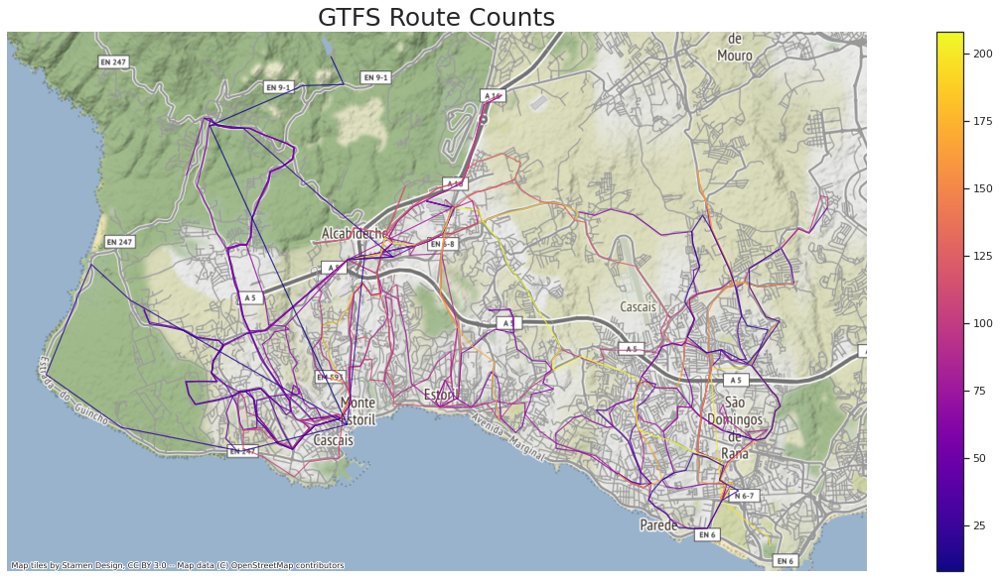

In [24]:
fig, ax = plt.subplots(figsize=(25, 10))

# Make plot for the Public Transport Network routes
gdf_plot = gdf_routes.to_crs(epsg=3857)
gdf_plot.plot(ax=ax, 
              column='counts', 
              cmap='plasma', 
              linewidth=1.2, 
              alpha=0.8, 
              legend=True)

cx.add_basemap(ax, crs=gdf_plot.crs.to_string())

# Finalize the map
ax.set_title('GTFS Route Counts', fontsize=25)
ax.axis('off');

The analysis of the public transport network of the Cascais Municipality shows us that the highest number of routes is concentrated between the *Carcavelos e Parede* and *Cascais e Estoril* parishes.

#### 5.2) Road Network & Bus Routes

In order to develop optimization of public transport routes during road interruptions, it is important to analyse the Road Network that is available at the moment. The first question that comes to our mind is:

**How many roads are registered in Cascais?**

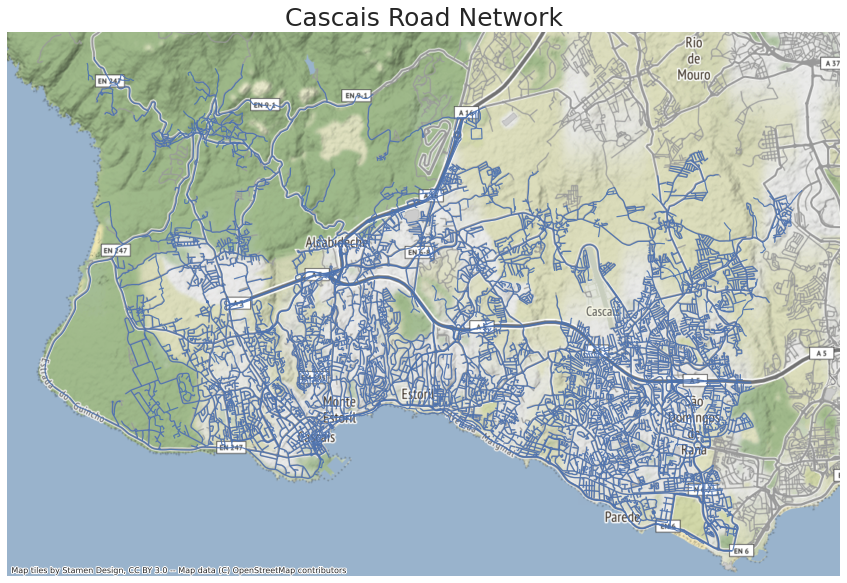

In [25]:
fig, ax = plt.subplots(figsize=(25, 10))

# Plot Complete Cascais Road Network
gdf_plot = road_network.to_crs(epsg=3857)
gdf_plot.plot(ax=ax, linewidth=1.2, alpha=0.9)

cx.add_basemap(ax, crs=gdf_plot.crs.to_string())

# Finalize the map
ax.set_title('Cascais Road Network', fontsize=25)
ax.axis('off');

The figure above gives us a geographical perspective on how the Road Network of Cascais is distributed. From the figure it can be seen that there is a higher concentration of roads closer to the South Coast Line of Cascais. The West Coastline is served by only one road, N247 wich makes sense, since from the map we can infer this zone is a Natural Park, without so many human population. (Color green indicates Natural Regions, while white indicates Regions with a lot of Human House Constructions).

In [26]:
total_number_roads = len(road_network)
number_unique_name_roads = len(road_network['Nome'].unique())

print(f'There are {total_number_roads:,} rows present in this dataset. \n')
print(f'But only {number_unique_name_roads:,} street names are present in this dataset. \n')
print('Let\'s find out what is happening!')

There are 12,013 rows present in this dataset. 

But only 3,490 street names are present in this dataset. 

Let's find out what is happening!


In [27]:
# Get name of the top-5 roads with the most repetitions in the dataset
print(road_network['Nome'].value_counts()[:5])
most_repeated_street = road_network['Nome'].value_counts().index[0]

print(f'\n Let\'s focus in the street with the most repetitions, {most_repeated_street}:')

Avenida da República      101
Rua Principal              94
Auto-Estrada A5            74
Avenida Marginal           73
Estrada Nacional 249-4     63
Name: Nome, dtype: int64

 Let's focus in the street with the most repetitions, Avenida da República:


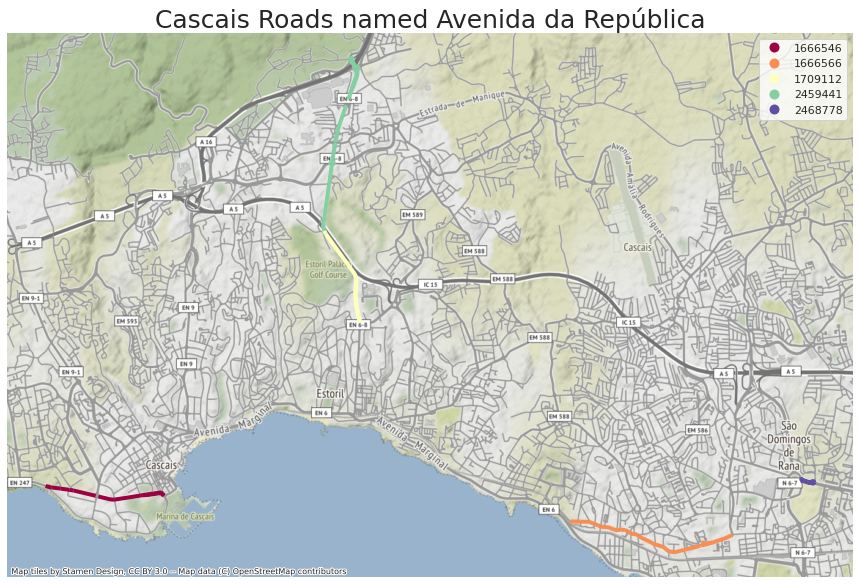

In [28]:
fig, ax = plt.subplots(figsize=(25, 10))

# Select only roads with the name 'Avenida da Répública'
streets_avenida = road_network[road_network['Nome']== most_repeated_street]

# Plot all 'Avenida da Répública'
gdf_plot = streets_avenida.to_crs(epsg=3857)
gdf_plot.plot(ax=ax,column='Rua Id', 
              categorical=True, 
              cmap='Spectral', 
              linewidth=4, 
              alpha=1, 
              legend=True)

cx.add_basemap(ax, crs=gdf_plot.crs.to_string())

# Finalize the map
ax.set_title(f'Cascais Roads named {most_repeated_street}', fontsize=25)
ax.axis('off');

From the image above we can see that althougth there are different roads with the same name, thanks to the identification code in the column **Código** one can easily identify the different roads.

So it can be concluded that the main roads are identified by the pair:

--> **Rua Id**, **Código**

**Rua Id** identifies the main road and **Código** specifies the subsequent elements of that main road.

In [29]:
main_streets = len(road_network['Rua Id'].unique())
streets = road_network.groupby(['Rua Id', 'Código']).size().sum()

print(f'There are {main_streets:,} main roads in Cascais.')
print(f'There are {streets:,} elementary roads in Cascais.')

There are 4,505 main roads in Cascais.
There are 11,162 elementary roads in Cascais.


**Which types of street are more common?**

In [30]:
road_network['Tipo'].value_counts()

Normal               11936
Passagem inferior       56
Passagem superior       21
Name: Tipo, dtype: int64

In [31]:
road_network['Sentido'].value_counts()

Dois Sentidos    8249
Inverso          2034
Directo          1228
Pedonal            98
Name: Sentido, dtype: int64

In [32]:
road_network['Classificação'].value_counts()

Rua                    11958
Acesso a via rápida       54
Desconhecido               1
Name: Classificação, dtype: int64

By looking at these 3 last code cells it can be seen that, as expected, Cascais is a well developed city. This premisse is corroborated by the great qualities of its infrastructure, in this specific case in terms of a road network characterised mostly by Normal streets with 2 ways and few intersections.

We will now take a closer look at the **Bus Routes** of Cascais:

In [33]:
# Get all Routes
carreira_bus_routes = bus_routes['Carreira'].unique() 
carreira_bus_routes = set(carreira_bus_routes)

# Get Inter Municipal Routes
inter_bus_routes = [route for route in carreira_bus_routes if not route.startswith('M')]
inter_bus_routes = set(inter_bus_routes)

# Only get Intra Municipal Routes
intra_bus_routes = carreira_bus_routes - inter_bus_routes

# Apply changes to the bus_routes data
bus_routes = bus_routes[bus_routes['Carreira'].isin(intra_bus_routes)]

# Display Information
print(f'There are currently {len(carreira_bus_routes)} different routes operating in Cascais. \n')
print(f'However, from these routes, {len(inter_bus_routes)} are inter municipal and so can be disregarded for our analysis. \n')
print(f'We ended up with {len(intra_bus_routes)} intra municipal bus routes.')

There are currently 53 different routes operating in Cascais. 

However, from these routes, 12 are inter municipal and so can be disregarded for our analysis. 

We ended up with 41 intra municipal bus routes.


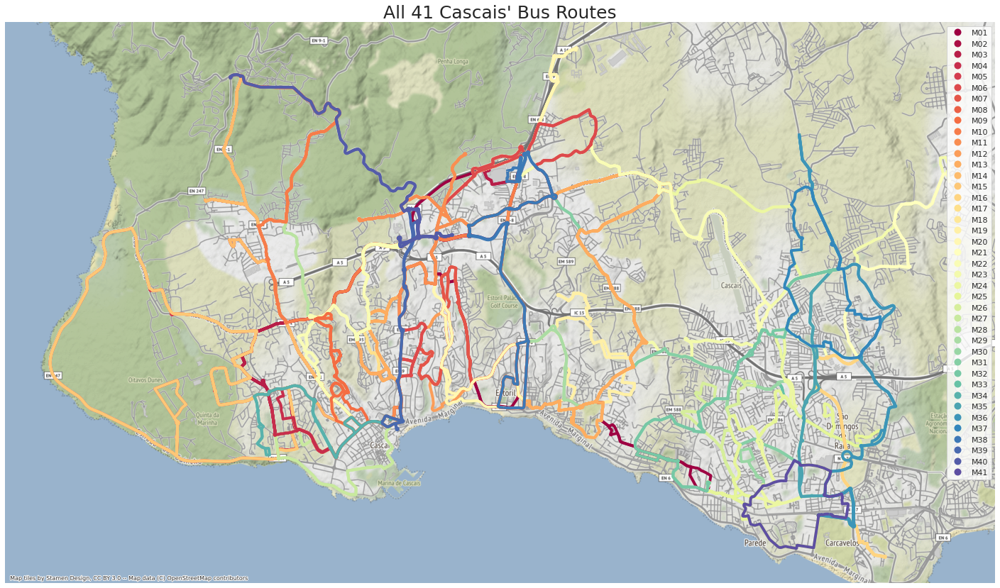

In [34]:
fig, ax = plt.subplots(figsize=(25, 15))

# Plot Bus Routes
gdf_plot = bus_routes.to_crs(epsg=3857)
gdf_plot.plot(ax=ax, 
              column='Carreira', 
              categorical=True, 
              cmap='Spectral', 
              linewidth=4, 
              alpha=1, 
              legend=True)

cx.add_basemap(ax, crs=gdf_plot.crs.to_string())

# Finalize the map
ax.set_title(f'All {len(intra_bus_routes)} Cascais\' Bus Routes', fontsize=25)
ax.axis('off');

#### 5.3) Interventions in Public Roads

The Cascais Municipality wants to "discover intervention trends on public roads **(geographical, temporal and frequency)** that indicate locations more prone to these interventions."

To get this information, we will answer some important questions. We want to check if there are any trends in these interruptions, and to identify them we are going to check:
- Most intervened streets
- Parishes
- Average intervention times
- Periods (years, semesters, months, and weekdays)
- Types of work

**a) What are the most interrupted routes?**

In [35]:
# Get the street name + the parish
interventions['Rua (Freguesia)'] = interventions['Rua'] + ' (' + interventions['Freguesia'] + ')'

In [36]:
print('\033[1mTop-10 Most Interrupted Routes\033[0m')

most_interrupted_routes = interventions['Rua (Freguesia)'].value_counts()
most_interrupted_routes.head(10)

Top-10 Most Interrupted Routes


Avenida Marginal (U.F. Cascais e Estoril)                    29
Avenida Infante Dom Henrique (U.F. Cascais e Estoril)        28
Avenida de Sabóia (U.F. Cascais e Estoril)                   27
Rua Dom Afonso Henriques (U.F. Cascais e Estoril)            27
Avenida Dom Nuno Álvares Pereira (U.F. Cascais e Estoril)    26
Estrada Nacional 249-4 (São Domingos de Rana)                23
Avenida Vinte e Cinco de Abril (U.F. Cascais e Estoril)      23
Rua Joaquim Ereira (U.F. Cascais e Estoril)                  20
Avenida da República (U.F. Carcavelos e Parede)              20
Avenida Nossa Senhora do Cabo (U.F. Cascais e Estoril)       20
Name: Rua (Freguesia), dtype: int64

We can see the top-5 most interrupted routes are all in the *Cascais e Estoril* parish. The most interrupted of all is *Avenida Marginal*, which is a very large road that connects Cascais to Lisbon. 

Moreover, in the top-10, only 2 routes are not in *Cascais e Estoril* (one is in *São Domingos de Rana* and another in *Carcavelos e Parede*).

**b) What is the parish with the most interventions? And the one with the least?**

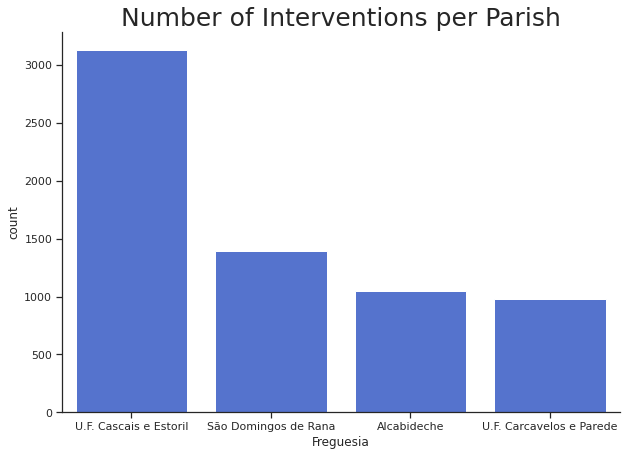

In [37]:
# Make barplot
plt.figure(figsize=(10, 7))

sns.countplot(interventions['Freguesia'], 
              order=interventions['Freguesia'].value_counts().index,
              color='royalblue')

plt.title('Number of Interventions per Parish', fontsize=25)
plt.show()

The barplot above shows that *Cascais e Estoril* has more than double the number of interventions when compared to the parish in 2nd place (which is *São Domingos de Rana*). The one in 1st place has 3 130 interventions, while the one in second has 1 391. 

*Alcabideche* appears in 3rd place with 1 049. 

*Carcavelos e Parede* has the least interventions, with only 980. 

Still, we can see that apart from *Cascais e Estoril*, the other 3 parishes are more or less balanced in this aspect.

**c) How is the distribution of the intervention times?**

In [38]:
# Get the duration of interventions (in days)
interventions['Duracao da intervencao'] = \
(interventions['Data Prevista de Fim']-interventions['Data Prevista de Inicio']).dt.days

In [39]:
# Get intervention times > or = to 0 (it is not plausible to have values below 0)
# And also, focus on the ones below 365 days (there are some extreme values that make it difficult to analyze the histogram)
intervention_time = interventions[interventions['Duracao da intervencao']>=0][['Duracao da intervencao', 'Freguesia', 'Tipo de Trabalho']].dropna()
intervention_time = intervention_time[intervention_time['Duracao da intervencao'] < 365]

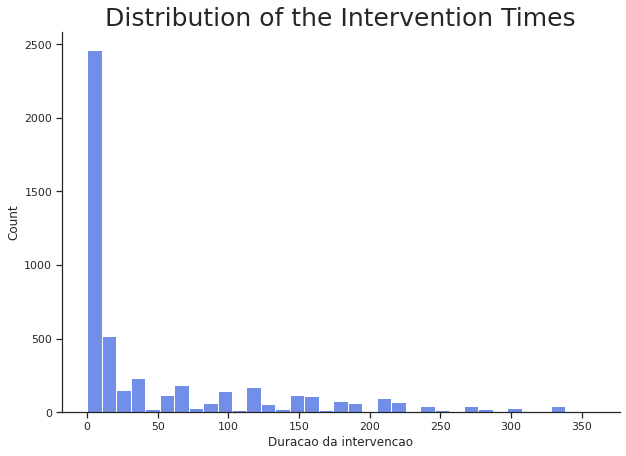

In [40]:
# Make histogram
plt.figure(figsize=(10, 7))

sns.histplot(data=intervention_time,
             x='Duracao da intervencao',
             color='royalblue')

plt.title('Distribution of the Intervention Times', fontsize=25)
plt.show()

In [41]:
# Get avg and median intervention times (original dataset)
avg_time = interventions['Duracao da intervencao'].mean()
median_time = interventions['Duracao da intervencao'].median()

print('\033[1mIncluding strange and extreme values:\033[0m')
print('Average intervention time =', int(avg_time), 'days')
print('Median intervention time =', int(median_time), 'days \n')

# Get avg and median intervention times (filtered dataset)
avg_time = intervention_time['Duracao da intervencao'].mean()
median_time = intervention_time['Duracao da intervencao'].median()

print('\033[1mExcluding strange and extreme values:\033[0m')
print('Average intervention time =', int(avg_time), 'days')
print('Median intervention time =', int(median_time), 'days')

Including strange and extreme values:
Average intervention time = 14 days
Median intervention time = 5 days 

Excluding strange and extreme values:
Average intervention time = 53 days
Median intervention time = 11 days


First of all, when building the histogram we noticed the intervention times had negative values (like we expected according to previous analyses). This does not seem plausible, as an intervention cannot end before it starts. This might be an error by the data provider and we need to tackle this issue if we use this date columns in the future.

Also, we saw some very extreme values on the intervention times. Thus, to properly visualize the histogram, we needed to apply a threshold of 365 days (1 year) on this dataset column.

Through the histogram, we can see the vast majority of projects last less than 50 days.

Furthermore, if we use all the data points, we get an Average intervention time of 14 days and a Median intervention time of 5 days. However, if we use the data associated to intervention times above or equal to 0 days and below 365, we get an Average intervention time of 53 days and a Median intervention time of 11 days.

**d) Is there any period of time that stands out in terms of road interventions?**

In [42]:
# Check months, weekdays, and semesters
interventions['Mes'] = interventions['Data Prevista de Inicio'].dt.month_name() # Months
interventions['Dia da semana'] = interventions['Data Prevista de Inicio'].dt.day_name() # Weekdays
interventions['Semestre'] = interventions['Data Prevista de Inicio'].dt.year.astype(str) + \
' - S' + np.where(interventions['Data Prevista de Inicio'].dt.quarter.gt(2), 2, 1).astype(str) # Semesters

In [43]:
# Clean semester data

# Replace 'nan - S1' by 'No data'
interventions['Semestre'] = interventions['Semestre'].map(lambda x: x.replace('nan - S1', 'No data'))

# Get only the two final characters ('S1' represents Semester 1, and 'S2' represents Semester 2)
interventions['Semestre'] = interventions['Semestre'].map(lambda x: x[-2:] if x != 'No data' else 'No data')

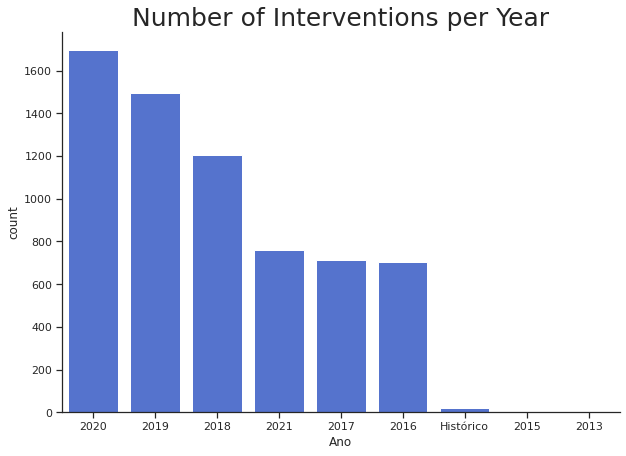

In [44]:
# Make barplot
plt.figure(figsize=(10, 7))

sns.countplot(interventions['Ano'],
              order=interventions['Ano'].value_counts().index,
              color='royalblue')

plt.title('Number of Interventions per Year', fontsize=25)
plt.show()

It seems like from 2016 to 2020 the number of interventions was always increasing, hitting the all-time high in 2020 (1 697 interventions), which shows an upward trend.

Before 2016 (i.e., 2013 and 2015) there is very little data.

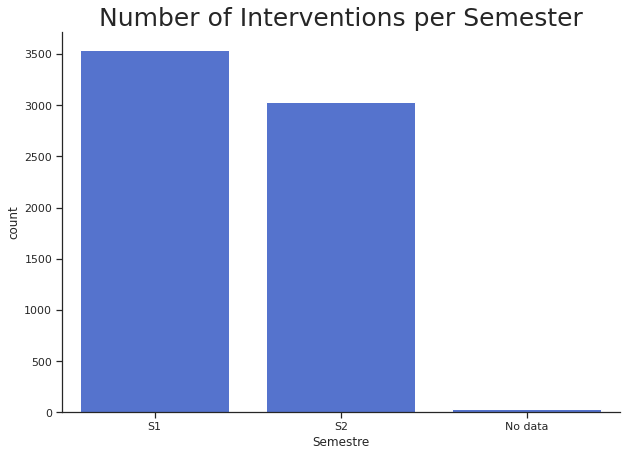

In [45]:
# Make barplot
plt.figure(figsize=(10, 7))

sns.countplot(interventions['Semestre'],
              order=interventions['Semestre'].value_counts().index,
              color='royalblue')

plt.title('Number of Interventions per Semester', fontsize=25)
plt.show()

In terms of semesters, it seems like none of them stand out. 

Semester 1 has just a slight advantage: 3 540 interventions. Semester 2 has 3 030.

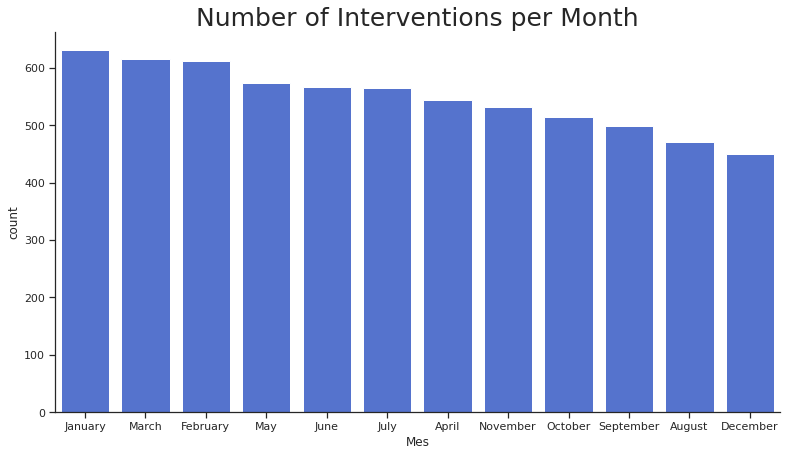

In [46]:
# Make barplot
plt.figure(figsize=(13, 7))

sns.countplot(interventions['Mes'],
              order=interventions['Mes'].value_counts().index,
              color='royalblue')

plt.title('Number of Interventions per Month', fontsize=25)
plt.show()

In terms of months, there is a clear trend:
- There are more intervention projects starting in the beggining of the year (January-March).
- While the lowest number of interventions is registered in August (summer vacation) and December (end of the calendar year).
- The two previous points reveal why Semester 1 has a slight advantage over Semester 2 in the "Number of Interventions per Semester" plot.

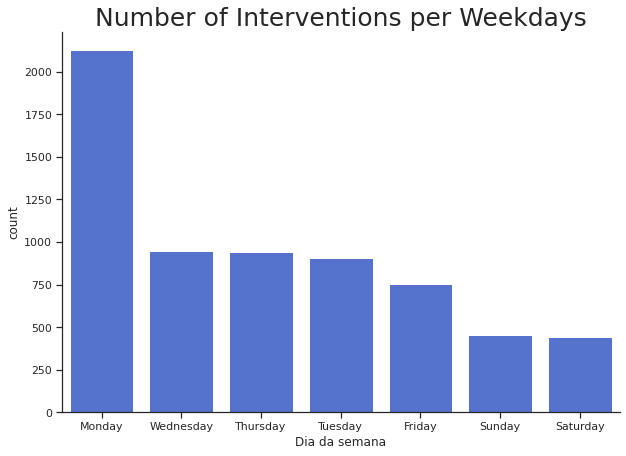

In [47]:
# Make barplot
plt.figure(figsize=(10, 7))

sns.countplot(interventions['Dia da semana'],
              order=interventions['Dia da semana'].value_counts().index,
              color='royalblue')

plt.title('Number of Interventions per Weekdays', fontsize=25)
plt.show()

The previous plot shows plausible information: there are much more road interventions starting in the beggining of the week (Monday) than in the weekend.

**e) What is the most common type of work? And the least?**

In [48]:
# Count each type of work
type_of_work = interventions['Tipo de Trabalho'].value_counts().reset_index()

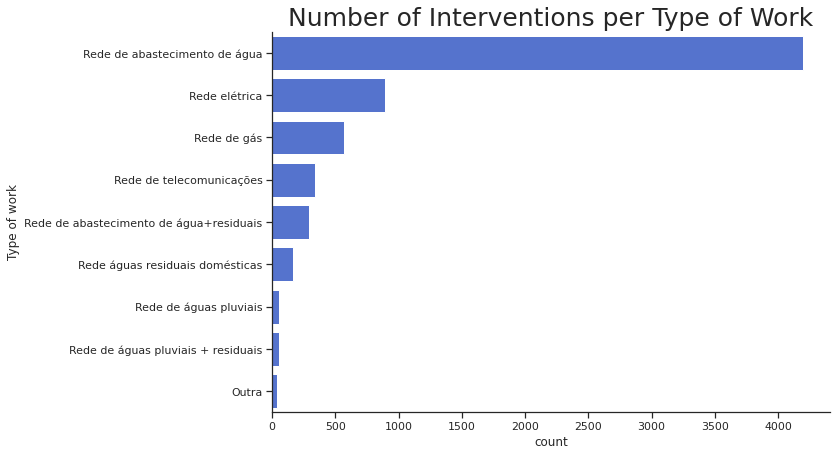

In [49]:
# Make barplot
plt.figure(figsize=(10, 7))

sns.barplot(data=type_of_work, 
            x='Tipo de Trabalho', 
            y='index', 
            color='royalblue',
            order=interventions['Tipo de Trabalho'].value_counts().index
            )

plt.title('Number of Interventions per Type of Work', fontsize=25)
plt.xlabel('count')
plt.ylabel('Type of work')
plt.show()

More than half (64%) of the interventions are due to the water supply network. If we join all "water-related" interventions, its number increases even more. To complete the top-3, we have the electrical network and gas network interventions.

The least common (excluding the "water-related" and unspecified interventions) is the telecommunications network, which only accounts for 5% of interventions.

**f) Can we locate hotspots of road iterventions on a map?**

**Note:** *We believe the road interventions data became too noisy, which led to unsatisfactory results. There are roads in different parishes that have the same name, which makes it hard to be sure about the coordinates of that road. The mnivp.csv file has the road name and the parish where the road is located, but it does not have its coordinates or even a Rua Id (Road ID) to join with the road network dataset. Thus, it becomes difficult to know which roads where intervened. Still, we decided to include this analysis here because the methodology might be useful to reach the goals of this project.*

In [50]:
# Get the number of interruptions per road (without the name of the parish)
interrupt_per_road = interventions['Rua'].value_counts().reset_index()
interrupt_per_road.columns = ['Rua (Not Usable)', 'Num Intervencoes']

In [51]:
# Get only the name of each road (if the string has more text, discard it)
def get_street(street):
    if ',' in street:
        street = street.split(',')
        street = street[0]
    elif '-' in street:
        street = street.split('-')
        street = street[0]
    return street

interrupt_per_road['Nome'] = interrupt_per_road['Rua (Not Usable)'].map(get_street)
interrupt_per_road = interrupt_per_road[['Nome', 'Num Intervencoes']]

In [52]:
# Get the coordinates for each road on 'interrupt_per_road'
interrupt_per_road_poly = interrupt_per_road.merge(road_network, on='Nome', how='left')\
[['Nome', 'geometry', 'Num Intervencoes']]

In [53]:
# Drop roads without coordinates
interrupt_per_road_poly = interrupt_per_road_poly[interrupt_per_road_poly['geometry'] != None]

# Get the "centroid" (midpoint) on each road
interrupt_per_road_poly['Midpoint'] = interrupt_per_road_poly.apply(lambda row: row['geometry'].centroid, axis=1)

# Get the 'lon' (longitude) and 'lat' (latitude) on each road's centroid
interrupt_per_road_poly['lon'] = interrupt_per_road_poly['Midpoint'].apply(lambda p: p.x)
interrupt_per_road_poly['lat'] = interrupt_per_road_poly['Midpoint'].apply(lambda p: p.y)

In [54]:
# Get a geo df with the road's midpoints 
interrupt_per_road_points = interrupt_per_road_poly.copy()
interrupt_per_road_points['geometry'] = interrupt_per_road_points['Midpoint']

interrupt_per_road_points = interrupt_per_road_points[['Nome', 'geometry', 'Num Intervencoes']]
interrupt_per_road_points = gpd.GeoDataFrame(interrupt_per_road_points)

# Get another geo df with the road's line strings 
interrupt_per_road_lines = interrupt_per_road_poly[['Nome', 'geometry', 'Num Intervencoes']]
interrupt_per_road_lines = gpd.GeoDataFrame(interrupt_per_road_lines)

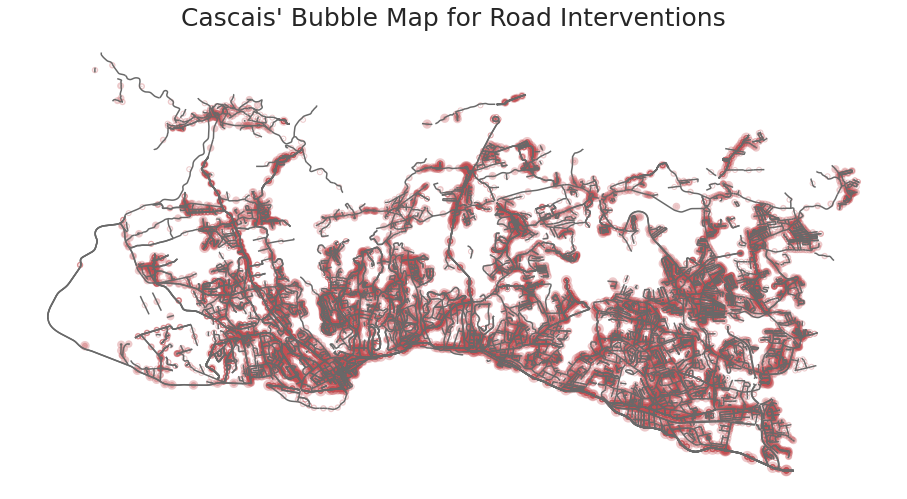

In [55]:
fig, ax = plt.subplots(figsize=(16,16))

# Make bubble map to visualize the roads/regions with the most road interventions
interrupt_per_road_lines.plot(ax=ax, 
                              color='dimgray', 
                              edgecolor='k', 
                              linewidth=1.5)

interrupt_per_road_points.plot(ax=ax, 
                               color='r',
                               markersize='Num Intervencoes', 
                               alpha=0.3,
                               linewidth=5)

# Finalize the map
plt.title('Cascais\' Bubble Map for Road Interventions', fontsize=25)
ax.axis('off')

plt.show()

This bubble map uses circles to represent interventions on the roads. It displays one bubble per geographic coordinate.

We can see that the western and northern parts of Cascais have less road interventions, which makes sense because many of those roads are inside the Sintra-Cascais Natural Park, where there is a lower population density and less cars passing by.

There are more road interventions in the center of Cascais, Estoril, Parede, and Carcavelos.

Still, we can see the vast majority of the roads in this municipality already had at least 1 intervention.

### 6. Clustering Geospatial Data

**Note:** *Once again, for the same reasons explained above, the geo data about road interventions became too noisy and the results were unsatisfactory. Still, we decided to also include this analysis here because the methodology might be useful to reach the goals of this project.*

Clustering is the task of grouping a set of objects in such a way that observations in the same group are more similar to each other than to those in other groups (unsupervised learning).

We will do clustering with geographic data to do some geospatial analysis. We need to do this clustering on road's midpoints/centroids, because we cannot do it on road polygons (we can only cluster points).

In [56]:
# Get a dataset to perform clustering
interrupt_per_road_poly = interrupt_per_road_poly[['Nome', 'lon', 'lat', 'Num Intervencoes']]

#### 6.1) K-means

K-means aims to partition the observations into a predefined number of clusters (k) in which each point belongs to the cluster with the nearest mean. It starts by randomly selecting k centroids and assigning the points to the closest cluster, then it updates each centroid with the mean of all points in the cluster.

We will use the Elbow Method to determine k.

In [57]:
def elbow_method(X):
    max_k = 10

    # Iterations
    distortions = []

    for i in range(1, max_k+1):
        if len(X) >= i:
            model = cluster.KMeans(n_clusters=i, 
                                   init='k-means++', 
                                   max_iter=300, 
                                   n_init=10, 
                                   random_state=42)
            model.fit(X)
            distortions.append(model.inertia_)

    # Best k: the lowest derivative
    k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i in np.diff(distortions,2)]))

    # Plot
    fig, ax = plt.subplots(figsize=(12,6))

    ax.plot(range(1, len(distortions)+1), distortions)
    ax.axvline(k, ls='--', color='red', label='k = '+str(k))

    ax.set_title('The Elbow Method', fontsize=25)

    ax.set(xlabel='Number of clusters', 
           ylabel='Distortion')

    ax.legend()

    plt.show()

    return k

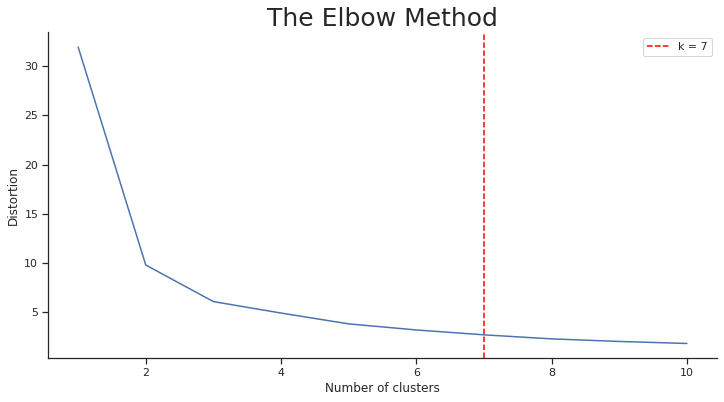

In [58]:
X = interrupt_per_road_poly[['lat', 'lon']]

k = elbow_method(X)

We can try with k = 7 so that the K-means algorithm will find 7 theoretical centroids. In addition, we will identify the real centroids (the closest observation to the cluster center).

In [59]:
# Define model with the number of clusters = k
model = cluster.KMeans(n_clusters=k, 
                       init='k-means++')

# Clustering
df_X = X.copy()
df_X['cluster_kmeans'] = model.fit_predict(X)

# Find the real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                                         df_X.drop('cluster_kmeans', axis=1).values)

df_X['centroids_kmeans'] = 0

for i in closest:
    df_X['centroids_kmeans'].iloc[i] = 1

# Add clustering info to the original dataset
interrupt_per_road_poly[['cluster_kmeans', 'centroids_kmeans']] = df_X[['cluster_kmeans', 'centroids_kmeans']]
interrupt_per_road_poly.sample(5)

,Nome,lon,lat,Num Intervencoes,cluster_kmeans,centroids_kmeans
11189,Avenida da República,-9.396672,38.734654,1,5,0
4126,Praceta Bartolomeu Dias,-9.440751,38.734638,4,6,0
16972,Avenida Marginal,-9.348541,38.682933,1,3,0
5498,Rua dos Navegantes,-9.421213,38.696403,2,2,0
2761,Rua de Lisboa,-9.340482,38.696459,6,3,0


We added 2 columns to the dataset: 'cluster_kmeans' indicating what cluster the observation belongs to, and 'centroids_kmeans' that is 1 if an observation is also the centroid (the closest to the center) and 0 otherwise.

Now, we can plot this data:

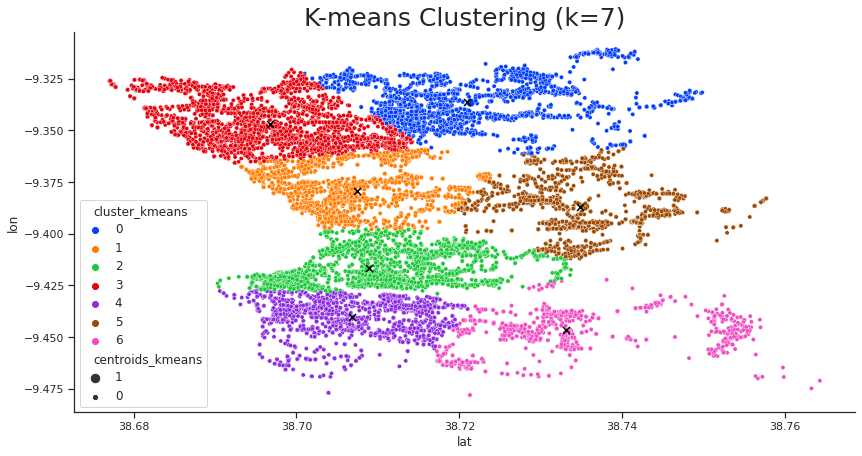

In [60]:
fig, ax = plt.subplots(figsize=(14,7))

# Plot road's midpoints
sns.scatterplot(x='lat', 
                y='lon', 
                data=interrupt_per_road_poly, 
                palette=sns.color_palette('bright',k),
                hue='cluster_kmeans', 
                size='centroids_kmeans', 
                size_order=[1,0],
                legend='brief', ax=ax)

# Plot cluster centroids
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], 
           th_centroids[:,1], 
           s=50, 
           c='black', 
           marker='x')

# Finalize the plot
ax.set_title('K-means Clustering (k='+str(k)+')', fontsize=25)

plt.show()

#### 6.2) Self-Organizing Map

Self-Organizing Maps (SOMs) are quite different, as they use Deep Learning. In fact, a SOM is a type of artificial neural network that is trained using unsupervised learning to produce a low-dimensional representation of the input space, called a "map" (also referred to as Kohonen layer).

Inputs are connected to *n x m* neurons which form the map. Here, we will experiment with a 4x4 SOM:

In [61]:
map_shape = (4,4)

# Scale data
scaler = preprocessing.StandardScaler()
X_preprocessed = scaler.fit_transform(X.values)

In [62]:
# Clustering
model = minisom.MiniSom(x=map_shape[0], 
                        y=map_shape[1], 
                        input_len=X.shape[1])

model.train_batch(X_preprocessed, num_iteration=100, verbose=False)

# Build output dataframe
df_X = X.copy()

df_X['cluster_som'] = np.ravel_multi_index(np.array([model.winner(x) for x in X_preprocessed]).T, 
                                        dims=map_shape)

# Find the real centroids
cluster_centers = np.array([vec for center in model.get_weights() 
                            for vec in center])

closest, distances = scipy.cluster.vq.vq(cluster_centers, X_preprocessed)

df_X['centroids_som'] = 0

for i in closest:
    df_X['centroids_som'].iloc[i] = 1

# Add clustering info to the original dataset
interrupt_per_road_poly[['cluster_som', 'centroids_som']] = df_X[['cluster_som', 'centroids_som']]
interrupt_per_road_poly.sample(5)

,Nome,lon,lat,Num Intervencoes,cluster_kmeans,centroids_kmeans,cluster_som,centroids_som
13078,Rua da Escola,-9.332274,38.724557,1,0,0,4,0
16214,Estrada da Ribeira,-9.414656,38.715610,1,2,0,2,0
6588,Rua Gomes Freire,-9.422329,38.696050,2,2,0,9,0
16629,Rua do Chafariz,-9.380632,38.724729,1,5,0,2,0
7564,Rua de Santo António,-9.406297,38.722458,1,2,0,2,0


In [63]:
k = interrupt_per_road_poly['cluster_som'].nunique()
print('k =', k)

k = 16


We added 2 columns to the dataset: 'cluster_som' indicating what cluster the observation belongs to, and 'centroids_som' that is 1 if an observation is also the centroid (the closest to the center) and 0 otherwise.

This generated k clusters (one cluster per SOM unit).

Now, we can plot this data:

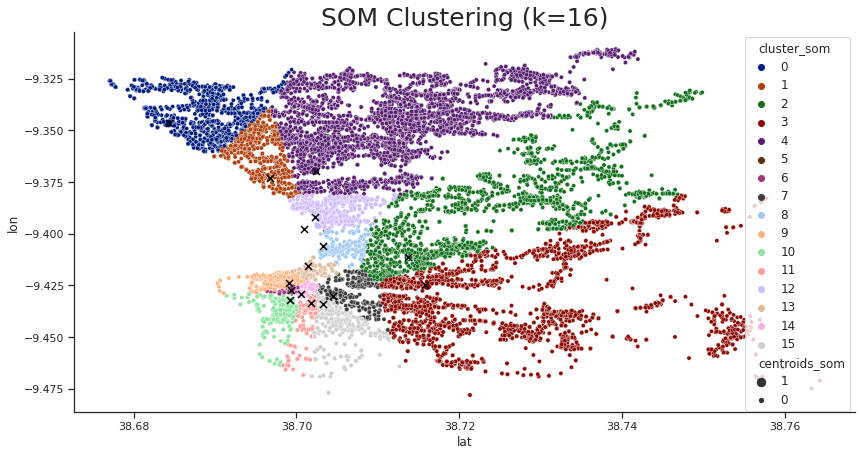

In [64]:
fig, ax = plt.subplots(figsize=(14,7))

# Plot road's midpoints
sns.scatterplot(x='lat', 
                y='lon', 
                data=interrupt_per_road_poly, 
                palette=sns.color_palette('dark',8) + sns.color_palette('pastel',8)[:k],
                hue='cluster_som', 
                size='centroids_som', 
                size_order=[1,0],
                legend='brief', 
                ax=ax)

# Plot cluster centroids
th_centroids = scaler.inverse_transform(cluster_centers)
ax.scatter(th_centroids[:,0], 
           th_centroids[:,1], 
           s=50, 
           c='black', 
           marker='x')

# Finalize the plot
ax.set_title('SOM Clustering (k='+str(k)+')', fontsize=25)

plt.show()

#### 6.3) Cluster Analysis

We decided to analyze the 7-cluster solution from K-means produced in 6.1.

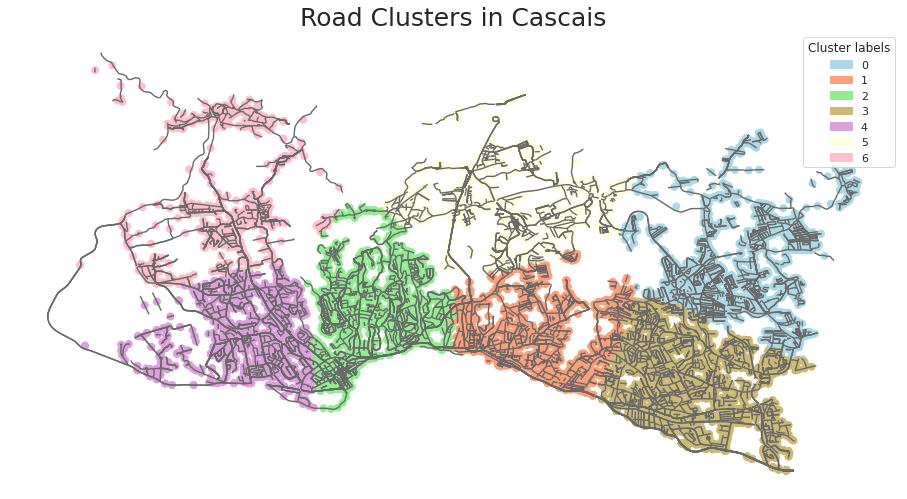

In [65]:
fig, ax = plt.subplots(figsize=(16,16))

# Make map to visualize the clusters
interrupt_per_road_lines.plot(ax=ax, 
                              color='dimgray', 
                              edgecolor='k', 
                              linewidth=1.4)

colors = {0:'lightblue', 1:'lightsalmon', 2:'lightgreen', 
          3:'y', 4:'plum', 5:'lightyellow', 6:'pink'}

interrupt_per_road_points.plot(ax=ax, 
                               color=interrupt_per_road_poly['cluster_kmeans'].map(colors),
                               linewidth=2)

# Finalize the map
plt.title('Road Clusters in Cascais', fontsize=25)

patch_list = []
for key in colors:
    data_key = mpatches.Patch(color=colors[key], label=key)
    patch_list.append(data_key)
plt.legend(handles=patch_list, title='Cluster labels')

ax.axis('off')

plt.show()

In [66]:
# Check avg number of interventions on each cluster
interrupt_per_road_poly.groupby('cluster_kmeans').mean()['Num Intervencoes']

cluster_kmeans
0    4.273669
1    4.971902
2    4.464182
3    4.361606
4    3.534925
5    4.393026
6    3.535055
Name: Num Intervencoes, dtype: float64

The cluster with the highest average number of interventions is Cluster 1 (around Parede and Estoril).

These clusters show little variability in terms of road interventions. Still, like it was said before, this data is noisy and the results are not as plausible as they could be, although the clustering algorithm is performing as expected.

### 7. Route Optimization Model

In this step we will perform route optimization, subject to contraints related with road interruptions.

We used the [**Distance Matrix API**](https://developers.google.com/maps/documentation/distance-matrix) from Google to calculate travel distances and times between locations. 

Then, we used this data to simulate interruptions based on the knowledge acquired and give suggestions about alternative stops for users, as well as a measure of the incovenience caused, expressed in the time spent walking from the initial to the nearest stop.

For this analysis, we used **route M01-1-001-A-U**, which goes from *Parede - Terminal - Rua de Timor* to *CascaiShopping - Terminal*, and has 21 stops.


In [67]:
# Read key
key = open(path + 'key.txt')
key = key.read()

# Method for calling the Distance Matrix API
def call_matrix_api(origins, destinations, mode='driving'):
    url = 'https://maps.googleapis.com/maps/api/distancematrix/json'
    params = {'key': key, 'origins': origins, 'destinations': destinations, 'mode': mode}

    req = requests.get(url=url, params=params)
    response = json.loads(req.content)

    return response

In [68]:
# Store stop location coordinates for route M01-1-001-A-U
stop_coords = pd.DataFrame()
ids = []

for index, row in df_dict['stop_times'].iterrows():
    if row['trip_id'][:3] == 'M01' and row['stop_id'] not in ids:
        ids.append(row['stop_id']) 
        stop_df = df_dict['stops'].loc[df_dict['stops']['stop_id'] == row['stop_id']]
        name = stop_df['stop_name'].tolist()[0]

        stop_coords.at[name, 'stop_lat'] = stop_df['stop_lat'].tolist()[0]
        stop_coords.at[name, 'stop_lon'] = stop_df['stop_lon'].tolist()[0]

stop_names = stop_coords.index.tolist()
stop_coords.head(3)

,stop_lat,stop_lon
Parede - Terminal - Rua de Timor,38.691912,-9.359075
Jardins da Parede,38.695098,-9.363975
Av. Jardim,38.695822,-9.367510


In [70]:
# Store time and distance between locations, by bus and by walking
dist_matrix = pd.DataFrame(columns=stop_names, index=stop_names)
time_bus_matrix = pd.DataFrame(columns=stop_names, index=stop_names)
time_walking_matrix = pd.DataFrame(columns=stop_names, index=stop_names)

for i in dist_matrix.index:
  for j in dist_matrix.columns:

    if i == j:
      dist_matrix.at[i, j] = 0
      time_bus_matrix.at[i,j] = 0 
      time_walking_matrix.at[i,j] = 0 

    else:
      lat_origin = str(stop_coords.at[i, 'stop_lat'])
      lon_origin = str(stop_coords.at[i, 'stop_lon'])

      lat_dst = str(stop_coords.at[j, 'stop_lat'])
      lon_dst = str(stop_coords.at[j, 'stop_lon'])

      api_call = call_matrix_api(lat_origin+','+lon_origin, lat_dst+','+lon_dst) 
      distance = api_call['rows'][0]['elements'][0]['distance']['text']
      time_bus = api_call['rows'][0]['elements'][0]['duration']['text']

      api_call_time_walking = call_matrix_api(lat_origin+','+lon_origin, lat_dst+','+lon_dst, 'walking') 
      time_walking = api_call_time_walking['rows'][0]['elements'][0]['duration']['text']

      dist_matrix.at[i, j] = distance.split()[0] 
      time_bus_matrix.at[i,j] = time_bus.split()[0]
      time_walking_matrix.at[i,j] = time_walking.split()[0] 

Based on the previous sections, we understand that ***Rua do Viveiro* is one of the most congested roads from the second cluster**, which is also the one that presents the highest average number of interventions.

If an intervention happens in this road, we **suggest the user to move to the nearest stop, calculating the time needed to reach it.**

In [71]:
stop_interventioned = 'Rua do Viveiro'

In [72]:
# Distances are given in km
min_dist = dist_matrix.loc[(dist_matrix[stop_interventioned]!=0)][stop_interventioned]
nearest_stop = pd.to_numeric(min_dist).idxmin()
distance = pd.to_numeric(min_dist).min()

# Time is given in minutes
min_time = time_walking_matrix.loc[time_walking_matrix[stop_interventioned]!=0][stop_interventioned][nearest_stop]
fastest_stop = pd.to_numeric(min_time)
time = pd.to_numeric(min_time).min()

print(f'The nearest stop from {stop_interventioned} is {int(distance*1000)} meters away, in {nearest_stop}.')
print(f'You are expected to take {time} minutes walking to the nearest stop.')

The nearest stop from Rua do Viveiro is 400 meters away, in Edifício Cruzeiro.
You are expected to take 5 minutes walking to the nearest stop.



Assuming that a bus will maintain its route when there is an intervention, our approach **allows users to optimize their routes** when an intervention occurs in the stop, or in the nearby areas of it, by going to the **nearest stop, with a time estimate of the incovenience caused by the intervention.**

Our approach can be extended to situations where **more than one stop is being interventioned**. If the user is going from *Rua do Viveiro* to *CascaiShopping*, and both stops are being interventioned, we suggest the user to move to the nearest stop and to get off the bus in the stop that minimizes the time spent on the bus.

In [73]:
stop_interventioned_1 = 'Rua do Viveiro'
stop_interventioned_2 = 'CascaiShopping'

In [74]:
# Distances are given in km
min_dist = dist_matrix.loc[(dist_matrix[stop_interventioned_1]!=0)][stop_interventioned_1]
nearest_stop = pd.to_numeric(min_dist).idxmin()
distance = pd.to_numeric(min_dist).min()

# Time is given in minutes
min_time = time_bus_matrix.loc[time_bus_matrix[stop_interventioned_2]!=0][stop_interventioned_2]
fastest_stop = pd.to_numeric(min_time).idxmin()
time = pd.to_numeric(min_time).min()

print(f'The nearest stop from {stop_interventioned_1} is {int(distance*1000)} meters away, in {nearest_stop}.')
print(f'You should get off the bus in {fastest_stop}, which will take {time} minutes more than the usual path.')

The nearest stop from Rua do Viveiro is 400 meters away, in Edifício Cruzeiro.
You should get off the bus in CascaiShopping - Terminal, which will take 2 minutes more than the usual path.



This approach can be extended to the remaining routes and stops from the Municipality of Cascais, as well as incorporated in a **mobile application that computes the distance and time matrices in real-time**, considering traffic and other factors that may influence these variables.

### 8. Conclusion

#### 8.1) Road Intervention Analysis and Route Optimization Dashboard

We believe two main products could be created from our code. 

Section 5.3 from this notebook can be seen as one of the products, because it fulfills one of the main goals on the project. This section does a data analysis on the routes of the road network that suffer the most cuts due to interventions. We give insights about parishes, most intervened streets, average intervention times, time frames, among others. With this, some trends can be identified and highlighted.

The other product is a Route Optimization Dashboard (similar to the mockup below). This would use the code from Section 7. It would be possible to check any bus route in Cascais, and "block" a specific bus stop. If that bus stop is cut due to a road intervention, then the program suggests the best stop for the user to go instead. This suggestion is based on the "levels of incovenience" to the user that we chose: travel distance and time spent.

<img src="https://elogii.com/blog/uploads/dashboard.jpg" alt="Dashboard" width="500"/>

#### 8.2) Solutions and Implementations

We will now propose some possible solutions for the issue of road interventions in Cascais. These are mainly directed to Cascais' City Council. We believe the city council can analyze the results from our analyses, and then use differentiated communication strategies targeted at the users of the public transport network.

Therefore, in order to help avoiding situations of distrust in the reliability
of the public transport network, we suggest the Cascais Municipality to:

1. **Check the data analysis** on Section 5.3. This can even evolve into a report or a dashboard that uses data visualization tools to identify trends on road interventions (geographical, temporal and frequency), indicating locations more prone to these interventions.

  We were able to conclude the big avenues in Cascais and in Estoril are the most prone to interventions, so the most intervened parish ends up being *Cascais e Estoril*. 

  Another interesting insight is that the majority of road interventions start in the first months of the year, on Mondays. With this knowledge, the public transport agency MobiCascais can notify the public transport users in *Cascais e Estoril* that some possible disturbance on the network might happen. This can be done through push notifications on the mobile app and through warnings near the bus stops. This will be specially useful for road interventions that are confirmed with some days or weeks in advance. Then, if MobiCascais gets the information that one road will surely be cut for some time, they can inform the users in a timely manner.

  Finally, another important insight is that the water supply network is the major cause for interventions. Thus, the city council can try to identify areas in the municipality that have less reliable water supply systems, to then warn the public transport agency that it is very likely some roads will need to be cut (and some communication needs to be done to warn local users).

2. **Use the Route Optimization Dashboard** described above, if possible, before deciding to cut a road. If the city council checks the dashboard and concludes there are good alternatives for the buses, then MobiCascais can communicate the updates to the users of the public transport network.

  Like said previously, the users can receive the suggestions through push notifications on the mobile app or in warnings put on the bus stops of that line. These suggestions could be something like: "Dear user, the bus stop in *R. do Viveiro*, line M 01, will be cut next Friday, April 22, due to a road intervention. We recommend you to please use *Edifício Cruzeiro* instead. Sorry for the inconvenience.". Ideally this types of message should be received only by the people that use line M 01, if the agency has that information.

#### 8.3) Future Work

- More data could be added to the Road Interventions dataset, specifically about a road's polygon/coordinates or its Road ID. This would make it easier to get geo data about each intervened road, thus generating more trustworthy information.
- The Cascais Open Data portal has data about the location of current and future stations of the bike sharing system of the public transport network. The data about the [shared bicycle network](https://dadosabertos.cascais.pt/pt_PT/dataset/rede-de-bicicletas-partilhadas) could be used to suggest the usage of soft mobility options. For example, if one bus stop is inaccessible due to a road intervention, the user could be suggested to ride a bike from his/her location to the next nearest bus stop. The bike's drop off zone should be near to the bus stop.
- Extend the route optimzation approach to combine multiple bus routes passing through similar stops, minimizing the impact of an intervention.

## 🖼️ Visualisations

**Visualisation 1:** Map with the Number of Routes in the Analysed Period

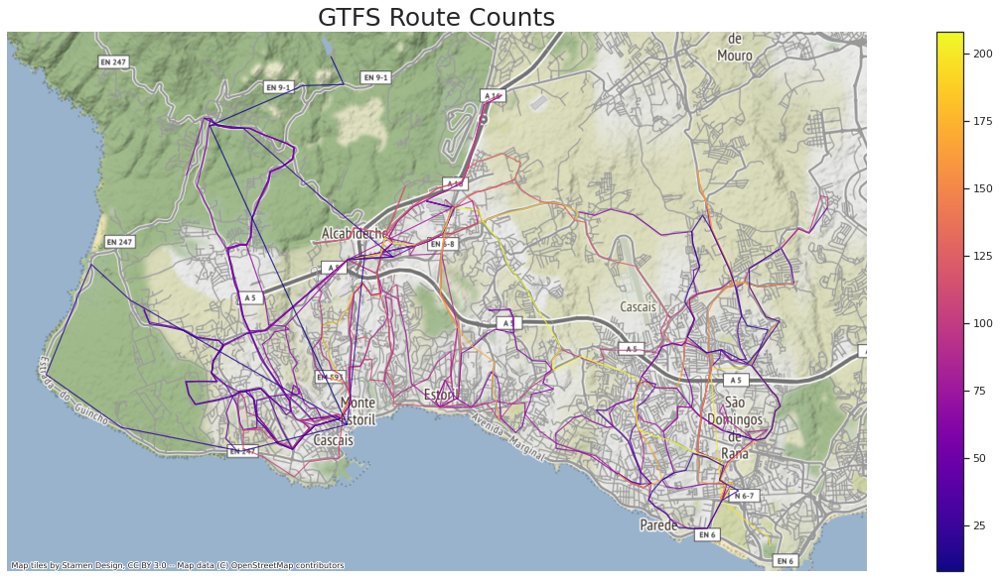

In [75]:
from IPython.display import Image

Image(filename=path + 'images/route_counts.png')

**Visualisation 2:** Bus Routes in Cascais

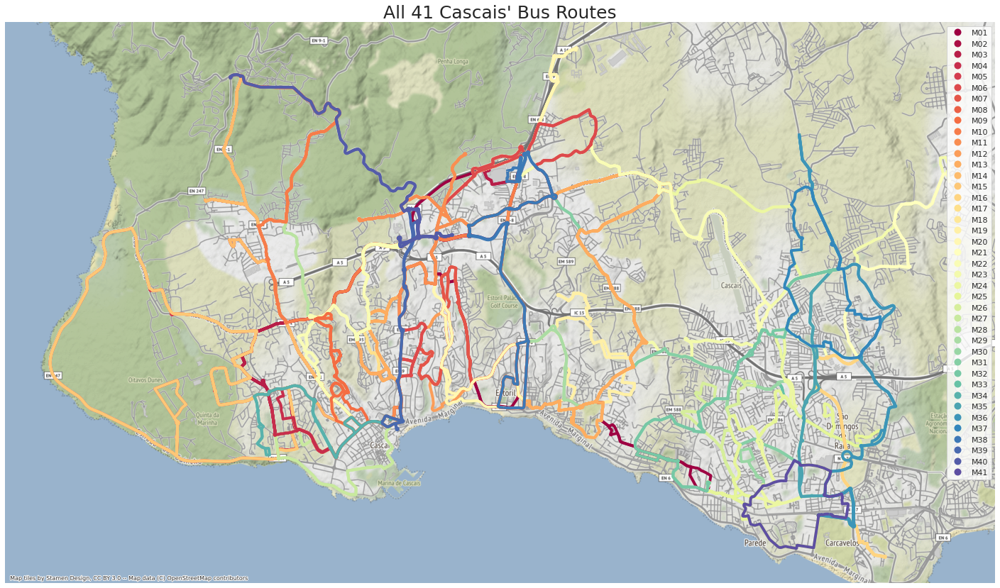

In [76]:
Image(filename=path + 'images/bus_routes.png')

**Visualisation 3:** Top-10 Most Interrupted Routes

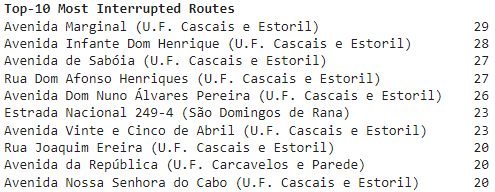

In [77]:
Image(filename=path + 'images/top10.png')

**Visualisation 4:** Number of Interventions per Month

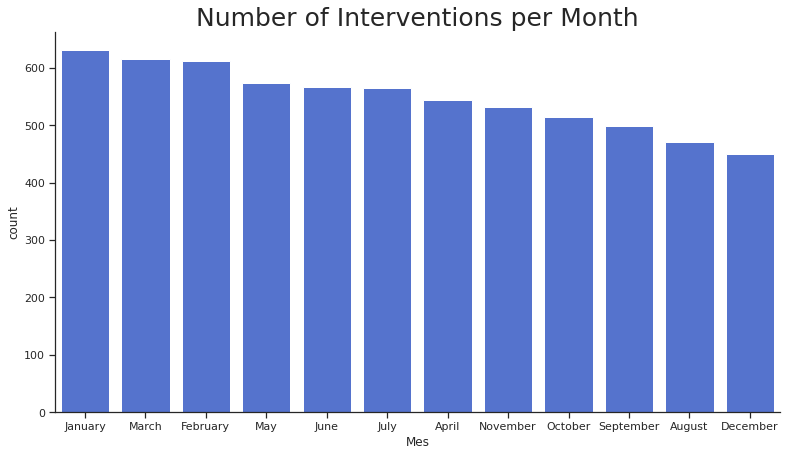

In [78]:
Image(filename=path + 'images/per_month.png')

**Visualisation 5:** Number of Interventions per Type of Work

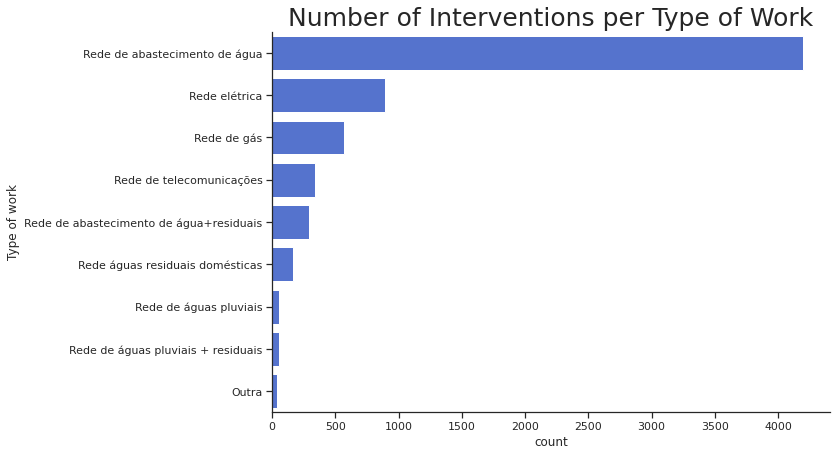

In [79]:
Image(filename=path + 'images/per_work.png')

## 👓 References

[1] United Nations Department of Economic and Social Affairs. "Make cities and human settlements inclusive, safe, resilient and sustainable". Available at: https://sdgs.un.org/goals/goal11

[2] American Public Transportation Association. "Public Transportation Facts". Available at: https://www.apta.com/news-publications/public-transportation-facts/

[3] Diário de Notícias. "Dois anos de transportes públicos gratuitos em Cascais trouxeram mais 10% de passageiros". Available at: https://www.dn.pt/local/dois-anos-de-transportes-publicos-gratuitos-em-cascais-trouxeram-mais-10-de-passageiros-14590773.html

[4] Cascais. "Autoridade de Transportes do Município de Cascais". Available at: https://www.cascais.pt/sub-area/autoridade-de-transportes-do-municipio-de-cascais

[5] Jornal de Negócios. "Cascais compra à CaetanoBus dois autocarros movidos a hidrogénio em investimento de um milhão de euros". Available at: https://www.jornaldenegocios.pt/empresas/transportes/detalhe/cascais-compra-a-caetanobus-dois-autocarros-movidos-a-hidrogenio-em-investimento-de-um-milhao-de-euros

[6] Luigi dell’Olio, Angel Ibeas, Patricia Cecin, "The quality of service desired by public transport users", Transport Policy, Volume 18, Issue 1, 2011, Pages 217-227, ISSN 0967-070X, https://doi.org/10.1016/j.tranpol.2010.08.005